```
Copyright (C) 2023 SINTEF Digital

This program is free software: you can redistribute it and/or modify
it under the terms of the GNU General Public License as published by
the Free Software Foundation, either version 3 of the License, or
(at your option) any later version.

This program is distributed in the hope that it will be useful,
but WITHOUT ANY WARRANTY; without even the implied warranty of
MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
GNU General Public License for more details.

You should have received a copy of the GNU General Public License
along with this program.  If not, see <http://www.gnu.org/licenses/>.
```

# Svalbard

Dependencies: GPUOcean havahol/amos branch.

The aim is to initialize a GPUOcean model from the Barents-2.5km operational model.

Operational model results can be found here:
https://thredds.met.no/thredds/catalog/fou-hi/barents_eps_zdepth/catalog.html

In [1]:
#Lets have matplotlib "inline"
%matplotlib inline

import os
import sys

#Import packages we need
import numpy as np
import xarray as xr
import datetime
from netCDF4 import Dataset
from IPython.display import display
from importlib import reload

#For plotting
import matplotlib
from matplotlib import pyplot as plt
import matplotlib as mpl
from matplotlib import animation, rc
plt.rcParams["animation.html"] = "jshtml"
mpl.rcParams['figure.facecolor'] = 'white'

In [2]:
from gpuocean.SWEsimulators import CDKLM16
from gpuocean.utils import Common, IPythonMagic, NetCDFInitialization
from gpuocean.drifters import GPUDrifterCollection

In [3]:
%cuda_context_handler gpu_ctx

In [31]:
# source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_zdepth/barents_zdepth_20230319T00Zm00_AN.nc" # <-- Gives tsunami 
source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_zdepth/barents_zdepth_20230815T00Zm00_AN.nc"  # Barents august z-depth
 
# Other models
# source_url = 'https://thredds.met.no/thredds/dodsC/fou-hi/nordic4km-1h/Nordic-4km_SURF_1h_avg_00.nc' # Nordic 4 km
# source_url = 'https://thredds.met.no/thredds/dodsC/fou-hi/norkyst800m-1h/NorKyst-800m_ZDEPTHS_his.an.2019071600.nc' # NorKyst 800
# source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_eps/barents_eps_20230605T12Z.nc" # Barents EPS (had u_bar, v_bar for all members summer 2023, but does not exist anymore...)
source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_sdepth/barents_his_20230909T00Zm00_AN.nc" # Barents s-depth
# source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_sdepth/barents_his_20240424T00Zm00_FC.nc" # Barents s-depth forecast (only available during forecast period...)
source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_surface/2023/08/27/T06Z/barents_sfc_20230827T06Zm08.nc" # Barents EPS, member 8, surface only...
source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_surface/2024/06/08/T06Z/barents_sfc_20240608T06Zm08.nc" # Barents EPS, member 8, surface only...
source_url = "https://thredds.met.no/thredds/dodsC/gpuocean/barents_eps/barents2500_barotropic_20240512T18Zm23.nc" # Barents EPS, member 23, tailored for GPU Ocean
# source_url = "https://thredds.met.no/thredds/dodsC/fou-hi/barents_eps_surface/2023/05/16/T06Z/barents_sfc_20230516T06Zm09.nc" # Barents EPS, member 9, surface only...

# source_url = "https://thredds.met.no/thredds/dodsC/metusers/johannesro/eps/barents_eps_20240316T00Z.nc" # Barents EPS, 6 members, surface only...


# source_url = "https://thredds.met.no/thredds/dodsC/romshindcast/NorFjords160/A12/norfjords_160m_his.nc4_2019121101-2019121200" # NorFjord 160!! Does not work with xarray, but might work with netcdf4.Dataset
# source_url = "https://thredds.met.no/thredds/dodsC/romshindcast/NorFjords160/A04/norfjords_160m_his.nc4_2019121101-2019121200" # NorFjord 160!! works also with xarray
# source_url = "https://thredds.met.no/thredds/dodsC/romshindcast/NorFjords160/A08/norfjords_160m_his.nc4_2019121101-2019121200" # NorFjord 160!! works also with xarray


In [8]:
def printInfo(url):
    try:
        ncfile = Dataset(url)
        print("Variables")
        for var in ncfile.variables:
            print(var)

        #print ("Attributes:")    
        #for attr in ncfile.ncattrs():
        #    print(attr, ": ", ncfile.getncattr(attr))
    
    except Exception as e:
        raise e
        
    finally:
        ncfile.close()

In [9]:
try:
    ncfile = Dataset(source_url)
    H_m = ncfile.variables['h'][:, :]
    #print(ncfile.getncattr('title'))
    #print(ncfile.getncattr('title').find('Nordic-4km') > -1)
except Exception as e:
    raise e
finally:
    ncfile.close()  

print('\n')
printInfo(source_url)



Variables
Cs_r
Cs_w
X
Y
depth
forecast_hour
forecast_reference_time
hc
projection_lambert
time
AKs
Uwind
Vwind
angle
h
ice_concentration
ice_thickness
ice_u
ice_v
lat
lon
salinity
sea_mask
temperature
u_eastward
v_northward
w
zeta


In [ ]:
try:
    ncfile = Dataset(source_url)
    H_m = ncfile.variables['h'][:, :]
    print(ncfile.getncattr('title'))
    print(ncfile.getncattr('title').find('Barents-2.5km') > -1)
except Exception as e:
    raise e
finally:
    ncfile.close()  

print('\n')
printInfo(source_url)

Barents-2.5km - ROMS
True


Variables
Cs_r
Cs_w
X
Y
depth
forecast_reference_time
hc
projection_lambert
time
u
v
AKs
Uwind
Vwind
angle
h
ice_concentration
ice_thickness
ice_u
ice_v
lat
lon
salinity
sea_mask
temperature
u_eastward
v_northward
w
zeta
Attributes:
file :  /lustre/storeB/project/fou/hi/oper/barents_eps/rundir/ecf-prod/barents_eps/barents_his_20230815T00Zm00.nc
Conventions :  CF-1.4, SGRID-0.3
type :  ROMS/TOMS history file
title :  Barents-2.5km - ROMS
var_info :  /home/havis/sea/ROMS/metroms_apps/barents-2.5km/include/varinfo.dat
rst_file :  /lustre/storeB/project/fou/hi/oper/barents_eps/rundir/ecf-prod/barents_eps/barents_rst_20230815T00Zm00.nc
his_file :  /lustre/storeB/project/fou/hi/oper/barents_eps/rundir/ecf-prod/barents_eps/barents_his_20230815T00Zm00.nc
avg_file :  /lustre/storeB/project/fou/hi/oper/barents_eps/rundir/ecf-prod/barents_eps/barents_avg_20230815T00Zm00.nc
grd_file :  /home/havis/sea/ROMS/metroms_apps/barents-2.5km/grid/barents_grd.nc
ini_file :  /lust

(949, 739)

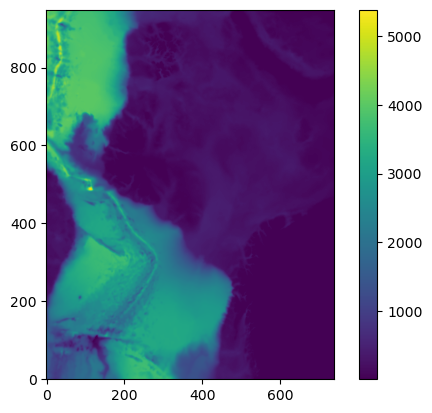

In [139]:
plt.imshow(H_m, origin="lower")
plt.colorbar()
H_m.shape

### Look at the file using xarrays

In [32]:
ds = xr.open_dataset(source_url)
ds

<xarray.Dataset>
Dimensions:     (eta_rho: 949, xi_rho: 739, eta_u: 949, xi_u: 738, eta_v: 948, xi_v: 739, ocean_time: 97)
Coordinates:
    lat_rho     (eta_rho, xi_rho) float64 ...
    lat_u       (eta_u, xi_u) float64 ...
    lat_v       (eta_v, xi_v) float64 ...
    lon_rho     (eta_rho, xi_rho) float64 ...
    lon_u       (eta_u, xi_u) float64 ...
    lon_v       (eta_v, xi_v) float64 ...
  * ocean_time  (ocean_time) datetime64[ns] 2024-05-12 ... 2024-05-16
Dimensions without coordinates: eta_rho, xi_rho, eta_u, xi_u, eta_v, xi_v
Data variables:
    ubar        (ocean_time, eta_u, xi_u) float32 ...
    vbar        (ocean_time, eta_v, xi_v) float32 ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 ...
Attributes: (12/34)
    file:                            /lustre/storeB/project/fou/hi/oper/baren...
    format:                          netCDF-4/HDF5 file
    Conventions:                     CF-1.4, SGRID-0.3
    type:                            ROMS/TOMS history file
    title:                           Barents-2.5km - ROMS
    var_info:                        /home/havis/sea/ROMS/metroms_apps/barent...
    ...                              ...
    tiling:                          003x036
    history:                         Mon May 13 01:19:04 2024: ncks -O -v zet...
    ana_file:                        ROMS/Functionals/ana_btflux.h, ROMS/Func...
    CPP_options:                     BARENTS, ADD_FSOBC, ADD_M2OBC, ALBEDO, A...
    NCO:                             netCDF Operators version 4.8.1 (Homepage...
    DODS_EXTRA.Unlimited_Dimension:  ocean_time

In [17]:

print("min depth: ", ds.h.min())
print("Num timesteps: ", len(ds.time))

print("dx: ", ds.X.data[1] - ds.X.data[0], ds.X.data[-2] - ds.X.data[-1])
print("dy: ", ds.Y.data[1] - ds.Y.data[0], ds.Y.data[-2] - ds.Y.data[-1])

print("depth:\n", ds.depth.data)

min depth:  <xarray.DataArray 'h' ()>
array(10.)
Num timesteps:  97
dx:  2500.0 -2499.75
dy:  2500.0 -2499.625
depth:
 [0.]


In [18]:
print(ds.X.shape)
print(ds.Y.shape)
print(ds.zeta.shape)
print(ds.u_eastward.shape)
print(ds.v_northward.shape)


(739,)
(949,)
(97, 949, 739)
(97, 1, 949, 739)
(97, 1, 949, 739)


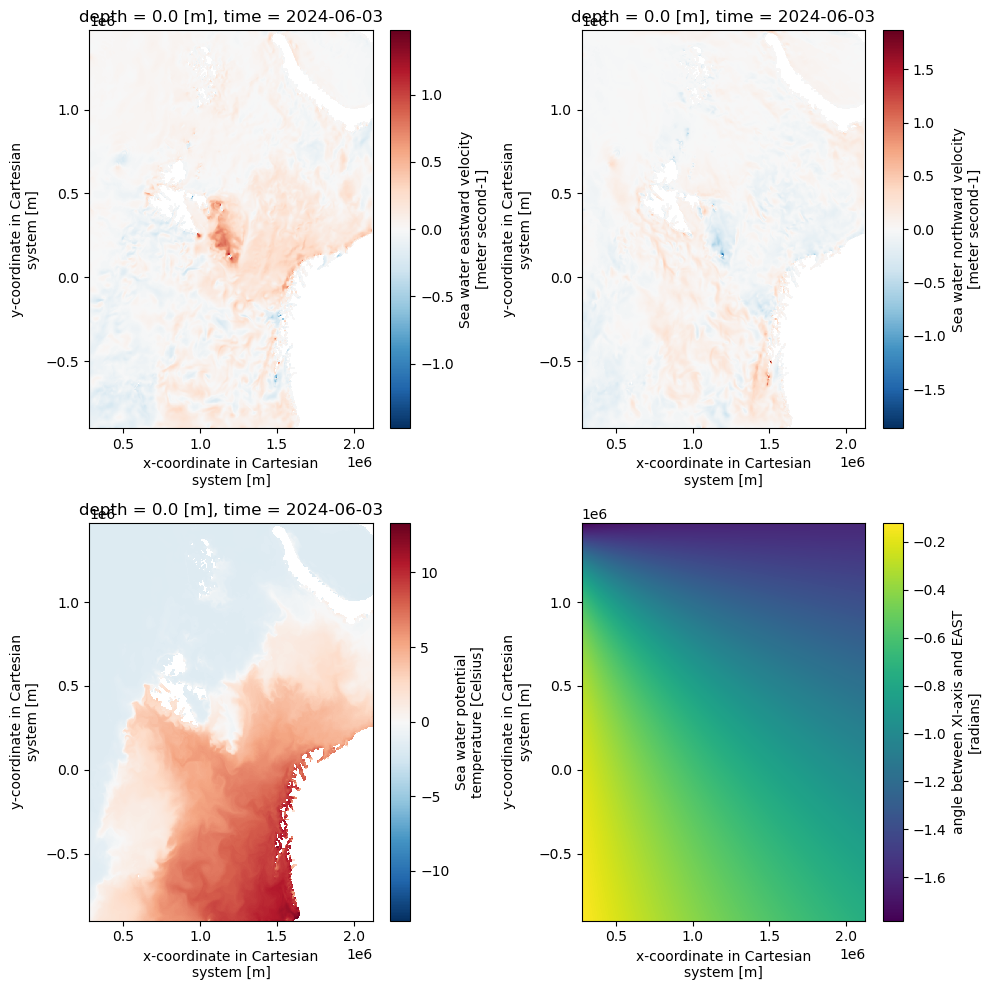

In [19]:
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(2,2,1)
ds.u_eastward.isel(time=0, depth=0).plot(ax=ax)
ax = plt.subplot(2,2,2)
ds.v_northward.isel(time=0, depth=0).plot(ax=ax)
ax = plt.subplot(2,2,3)
ds.temperature.isel(time=0, depth=0).plot(ax=ax)
ax = plt.subplot(2,2,4)
ds.angle.isel().plot(ax=ax)
plt.tight_layout()

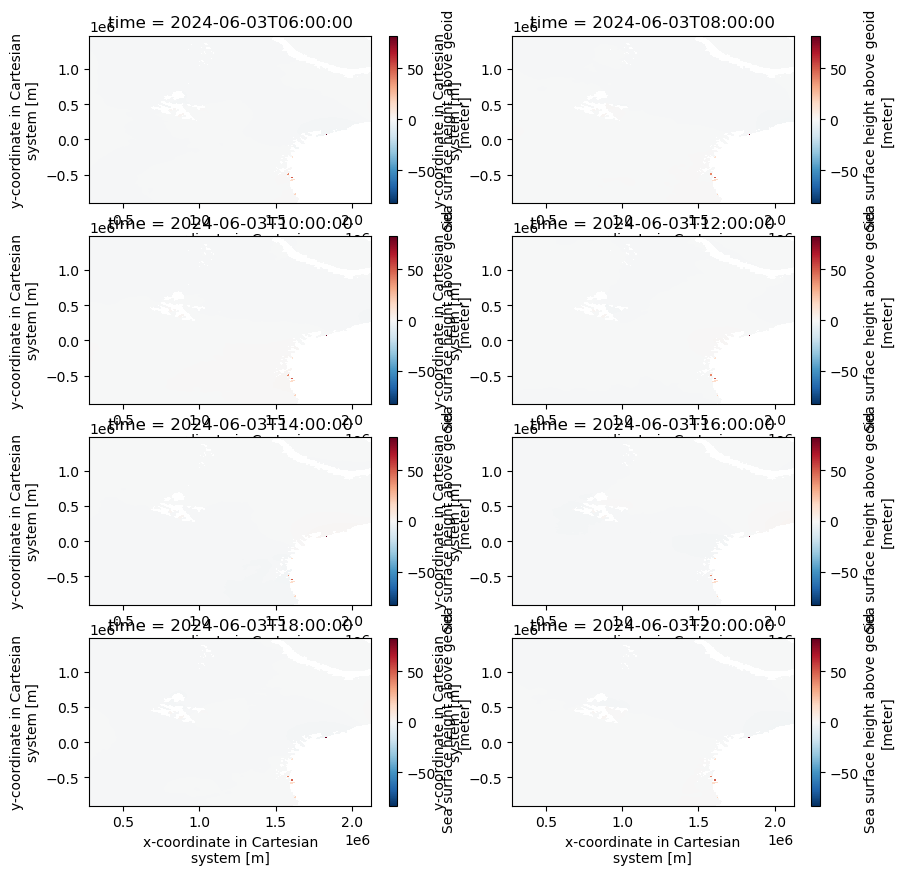

In [20]:
# Time series of eta:
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(4,2,1)
ds.zeta.isel(time=6).plot(ax=ax)
ax = plt.subplot(4,2,2)
ds.zeta.isel(time=8).plot(ax=ax)
ax = plt.subplot(4,2,3)
ds.zeta.isel(time=10).plot(ax=ax)
ax = plt.subplot(4,2,4)
ds.zeta.isel(time=12).plot(ax=ax)
ax = plt.subplot(4,2,5)
ds.zeta.isel(time=14).plot(ax=ax)
ax = plt.subplot(4,2,6)
ds.zeta.isel(time=16).plot(ax=ax)
ax = plt.subplot(4,2,7)
ds.zeta.isel(time=18).plot(ax=ax)
ax = plt.subplot(4,2,8)
ds.zeta.isel(time=20).plot(ax=ax)


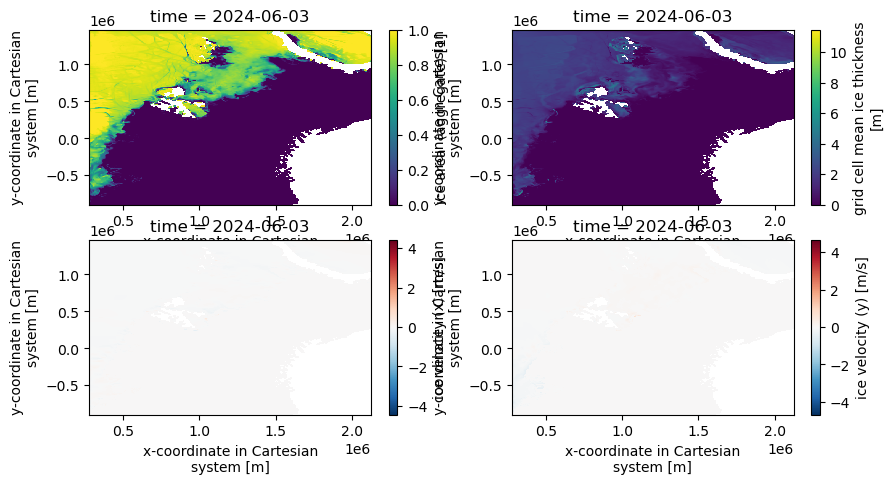

In [21]:
fig = plt.figure(figsize=(10, 5))
ax = plt.subplot(2,2,1)
ds.ice_concentration.isel(time=0).plot(ax=ax)
ax = plt.subplot(2,2,2)
ds.ice_thickness.isel(time=0).plot()
ax = plt.subplot(2,2,3)
ds.ice_u.isel(time=0).plot(ax=ax)
ax = plt.subplot(2,2,4)
ds.ice_v.isel(time=0).plot()


739 949


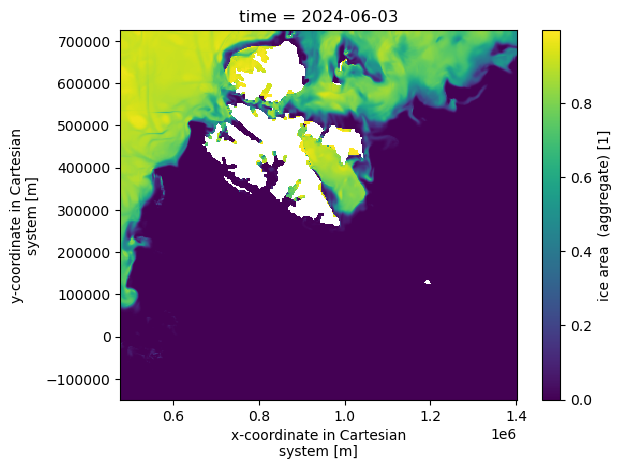

In [22]:
print(len(ds.X), len(ds.Y))
x0, x1 = 80, 450
y0, y1 = 300, 650
ds.ice_concentration.isel(time=0, X=slice(x0, x1), Y=slice(y0, y1)).plot()


## Initialize GPU Ocean model

In [23]:
def plotSolution(fig, sim, comment="",
                 eta_max=2, hu_max=50, 
                 ax=None, sp=None):

    eta, hu, hv = sim.download(interior_domain_only=True)
    dx, dy, t = sim.dx, sim.dy, sim.t
    
    from datetime import timedelta
    fig.suptitle("Time = {:0>8} ({:s})".format(str(timedelta(seconds=int(t))), comment), 
                 fontsize=18,
                 horizontalalignment='left')
    
    ny, nx = eta.shape
    domain_extent = [0, nx*dx, 0, ny*dy]
   
    if (ax is None):
        ax = [None]*3
        sp = [None]*3
        
        ax[0] = plt.subplot(1, 3, 1)
        sp[0] = ax[0].imshow(eta, interpolation="none", origin='lower', 
                             cmap=plt.cm.BrBG, vmin=-eta_max, vmax=eta_max, 
                             extent=domain_extent)
        plt.colorbar(sp[0], shrink=0.9)
        plt.axis('image')
        plt.title("$\eta{}$")
        
        ax[1] = plt.subplot(1, 3, 2)
        sp[1] = ax[1].imshow(hu, interpolation="none", origin='lower', 
                            cmap=plt.cm.coolwarm, vmin=-hu_max, vmax=hu_max, 
                            extent=domain_extent)
        plt.colorbar(sp[1], shrink=0.9)
        plt.axis('image')
        plt.title("$hu$")

        ax[2] = plt.subplot(1, 3, 3)
        sp[2] = ax[2].imshow(hv, interpolation="none", origin='lower', 
                             cmap=plt.cm.coolwarm, vmin=-hu_max, vmax=hu_max, 
                             extent=domain_extent)
        plt.colorbar(sp[2], shrink=0.9)
        plt.axis('image')
        plt.title("$hv$")
            
    else:        
        #Update plots
        fig.sca(ax[0])
        sp[0].set_data(eta)
        
        fig.sca(ax[1])
        sp[1].set_data(hu)
        
        fig.sca(ax[2])
        sp[2].set_data(hv)
        
    return ax, sp


def sim_animation(sim, T, anim_dt, hu_max=20.0, eta_max=0.5, comment=""):
    """
    Creates an animation of the simulator based on T frames, with frames sub_dt*sim.dt appart.
    """

    
    #Create figure and plot initial conditions
    fig = plt.figure(figsize=(14, 4))
    ax, sp = plotSolution(fig, sim, comment=comment,
                          eta_max=eta_max, hu_max=hu_max)
    #Helper function which simulates and plots the solution
    def animate(i):
        if (i>0):
            t = sim.step(anim_dt)
        else:
            t = 0.0

        plotSolution(fig, sim, comment=comment, ax=ax, sp=sp)
        print(".", end='')
        
    #Matplotlib for creating an animation
    anim = animation.FuncAnimation(fig, animate, range(T), interval=100)
    plt.close(fig)
    return anim

In [24]:
reload(NetCDFInitialization)
data_args = NetCDFInitialization.getInitialConditions(source_url, x0, x1, y0, y1, download_data=False)

Exception caught: Resetting to CUDA context gpu_ctx
Traceback (most recent call last):
  File "c:\Users\havardh\Miniconda3\envs\gpuocean-extra\lib\site-packages\IPython\core\interactiveshell.py", line 3552, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\havardh\AppData\Local\Temp\ipykernel_25036\1841070452.py", line 2, in <module>
    data_args = NetCDFInitialization.getInitialConditions(source_url, x0, x1, y0, y1, download_data=False)
  File "C:\Users\havardh\playground-win\gpuocean\havahol-gpuocean\src\gpuocean\utils\NetCDFInitialization.py", line 182, in getInitialConditions
    raise e
  File "C:\Users\havardh\playground-win\gpuocean\havahol-gpuocean\src\gpuocean\utils\NetCDFInitialization.py", line 175, in getInitialConditions
    u0 = ncfile.variables['ubar'][t0_index, y0:y1, x0:x1]
KeyError: 'ubar'


KeyError: 'ubar'

In [177]:
if "sim" in globals():
    sim.cleanUp()
    
sim = CDKLM16.CDKLM16(gpu_ctx, write_netcdf=False,  **NetCDFInitialization.removeMetadata(data_args))
T = 24
anim_dt = 3600/12
sim_animation(sim, T, anim_dt, hu_max=50.0, eta_max=2, comment="Svalbard")

This will give inaccurate angle along the border!
This will give inaccurate coriolis along the border!


.........................

### Run the complete domain 

In [337]:
big_x0, big_y0 = 10, 10
big_x1, big_y1 = 739-10, 949-10

big_data_args = NetCDFInitialization.getInitialConditions(source_url, big_x0, big_x1, big_y0, big_y1, download_data=False)

In [5]:
if "sim" in globals():
    sim.cleanUp()
    
sim = CDKLM16.CDKLM16(gpu_ctx, dt=0.0, write_netcdf=False,  **NetCDFInitialization.removeMetadata(big_data_args))
T = 24
anim_dt = 100
sim_animation(sim, T, anim_dt, hu_max=50.0, eta_max=2, comment="Svalbard")

### Prototyping for initialization

In [311]:
try:
    # Read variables that are common for all models
    ncfile = Dataset(source_url)
    H_m = ncfile.variables['h'][y0-1:y1+1, x0-1:x1+1]
    eta0 = ncfile.variables['zeta'][0, y0-1:y1+1, x0-1:x1+1]
    angle = ncfile.variables['angle'][y0:y1, x0:x1]
    latitude = ncfile.variables['lat'][y0:y1, x0:x1]
    x = ncfile.variables['X'][x0:x1]
    y = ncfile.variables['Y'][y0:y1]
except Exception as e:
    raise e
finally:
    ncfile.close()        


In [19]:
if source_url.find("barents"):
    print("hei")

hei


In [340]:
try:
    # Read variables that are common for all models
    ncfile = Dataset(source_url)
    u = ncfile.variables['u'][0, :, y0-1:y1+1, x0-1:x1+1]
    v = ncfile.variables['v'][0, :, y0-1:y1+1, x0-1:x1+1]
    lat = ncfile.variables['lat'][y0-1:y1+1, x0-1:x1+1]
    lon = ncfile.variables['lon'][y0-1:y1+1, x0-1:x1+1]
    depth = ncfile.variables['depth'][:]
    print(u.shape, depth.shape)
except Exception as e:
    raise e
finally:
    ncfile.close()        

(16, 352, 372) (16,)


(77.06050109863281, 11.486795425415039)

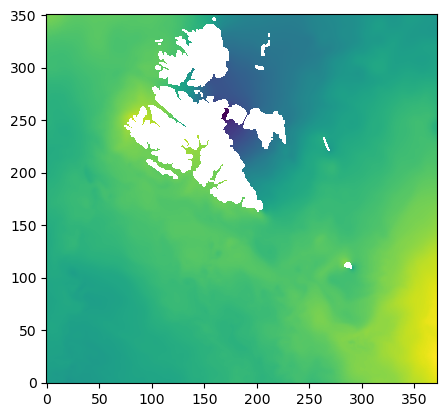

In [342]:
plt.imshow(eta0, origin='lower')
(lat[150, 150], lon[150,150])


In [128]:
print(u[:, 300, 300])
print(H_m[300, 300])
print(eta0[300, 300])
print(depth)
print(np.min(eta0))


def testHu(i, j):
    depth_m = (depth[1:] + depth[:-1])/2 
    print(depth_m)
    h = H_m[j, i] + eta0[j, i]
    hu = (eta0[j, i] + depth_m[0])*u[0, j, i]
    print("upper layer hu: ", hu)
    for d in range(1, len(depth)-1):
        if depth[d+1] < H_m[j, i]:
            hu = hu + (depth_m[d] - depth_m[d-1])*u[d, j, i]
            print(d, [depth_m[d-1], depth_m[d]], u[d, j, i], hu)
        elif u.mask[d, j, i]:
            print("missing value", d, u[d, j, i])
            break
        else:
            hu = hu + (H_m[j, i] - depth_m[d-1])*u[d, j, i]
            print(d, [depth_m[d-1], H_m[j, i]], u[d, j, i], hu)
            break
    print("result: ", hu)
testHu(300, 300)


[-0.16548210382461548 -0.15940986573696136 -0.1487225890159607
 -0.14341133832931519 -0.13330870866775513 -0.052111171185970306
 -0.03215620666742325 -0.03744059428572655 -0.060878101736307144 -- -- --
 -- -- -- --]
170.60260009765625
-0.35679147
[   0.    3.   10.   15.   25.   50.   75.  100.  150.  200.  250.  300.
  500. 1000. 2000. 3000.]
-1.1635187
[1.5 6.5 12.5 20.0 37.5 62.5 87.5 125.0 175.0 225.0 275.0 400.0 750.0
 1500.0 2500.0]
upper layer hu:  -0.18918055323804772
1 [1.5, 6.5] -0.15940987 -0.9862298819228545
2 [6.5, 12.5] -0.14872259 -1.8785654160186187
3 [12.5, 20.0] -0.14341134 -2.9541504534884826
4 [20.0, 37.5] -0.13330871 -5.287052855174197
5 [37.5, 62.5] -0.05211117 -6.589832134823455
6 [62.5, 87.5] -0.032156207 -7.393737301509036
7 [87.5, 125.0] -0.037440594 -8.797759587223782
8 [125.0, 170.60260009765625] -0.0608781 -11.573959315409029
result:  -11.573959315409029


In [58]:
print(eta0[250, 150])
testHu(150, 250)

--
[1.5 6.5 12.5 20.0 37.5 62.5 87.5 125.0 175.0 225.0 275.0 400.0 750.0
 1500.0 2500.0]
--
1 [1.5, 10.0]
result:  --


In [301]:
def verticalIntegrateCurrent(source_url_list, x0, x1, y0, y1):
    try:
        ncfile = Dataset(source_url)
        H_m = ncfile.variables['h'][y0-1:y1+1, x0-1:x1+1]
        eta0 = ncfile.variables['zeta'][0, y0-1:y1+1, x0-1:x1+1]
        u = ncfile.variables['u'][0, :, y0-1:y1+1, x0-1:x1+1]
        v = ncfile.variables['v'][0, :, y0-1:y1+1, x0-1:x1+1]
        depth = ncfile.variables['depth'][:]
    except Exception as e:
        raise e
    finally:
        ncfile.close()   

    ny, nx = eta0.shape

    hu = np.zeros_like(eta0)
    hv = np.zeros_like(eta0)

    depth_m = (depth[1:] + depth[:-1])/2 
    dz = depth_m[1:] - depth_m[:-1]

    for j in range(ny):
        for i in range(nx):
            #h = H_m[j, i] + eta0[j, i]
            hu_tmp = (eta0[j, i] + depth_m[0])*u[0, j, i]
            hv_tmp = (eta0[j, i] + depth_m[0])*v[0, j, i]        

            for d in range(1, len(depth)-1):
                if depth[d+1] < H_m[j, i]:
                    hu_tmp = hu_tmp + (depth_m[d] - depth_m[d-1])*u[d, j, i]
                    hv_tmp = hv_tmp + (depth_m[d] - depth_m[d-1])*v[d, j, i]
                elif u.mask[d, j, i]:
                    break
                else:
                    hu_tmp = hu_tmp + (H_m[j, i] - depth_m[d-1])*u[d, j, i]
                    hv_tmp = hv_tmp + (H_m[j, i] - depth_m[d-1])*v[d, j, i]
                    break
            hu[j, i] = hu_tmp
            hv[j, i] = hv_tmp
    return hu, hv

def verticalIntegrateCurrent2(source_url_list, x0, x1, y0, y1):
    try:
        ncfile = Dataset(source_url)
        H_m = ncfile.variables['h'][y0-1:y1+1, x0-1:x1+1]
        eta0 = ncfile.variables['zeta'][0, y0-1:y1+1, x0-1:x1+1]
        u = ncfile.variables['u'][0, :, y0-1:y1+1, x0-1:x1+1]
        v = ncfile.variables['v'][0, :, y0-1:y1+1, x0-1:x1+1]
        depth = ncfile.variables['depth'][:]
    except Exception as e:
        raise e
    finally:
        ncfile.close()   

    ny, nx = eta0.shape
    
    u.set_fill_value(0.0)
    u = u.filled()
    v.set_fill_value(0.0)
    v = v.filled()

    #hu = np.zeros_like(eta0)
    #hv = np.zeros_like(eta0)
    depth_m = (depth[1:] + depth[:-1])/2 

    hu = (eta0 + depth_m[0])*u[0, :, :]
    hv = (eta0 + depth_m[0])*v[0, :, :]

    for d in range(1, len(depth)-1):
        
        #tmp_hu = np.maximum(np.zeros_like(eta0), np.minimum(depth_m[d], H_m) - depth_m[d-1])# *u[d,:,:]
        hu = hu + np.maximum(np.zeros_like(eta0), np.minimum(depth_m[d], H_m) - depth_m[d-1])*u[d,:,:]
        hv = hv + np.maximum(np.zeros_like(eta0), np.minimum(depth_m[d], H_m) - depth_m[d-1])*v[d,:,:]
        
    hu = hu + np.maximum(np.zeros_like(eta0), H_m - depth_m[-1])*u[-1,:,:]
    hv = hv + np.maximum(np.zeros_like(eta0), H_m - depth_m[-1])*v[-1,:,:]

    return hu, hv

In [162]:
hu, hv = verticalIntegrateCurrent(source_url, x0, x1, y0, y1)

(16,) (15,) (14,)


In [304]:
hu2, hv2 = verticalIntegrateCurrent2(source_url, x0, x1, y0, y1)

In [214]:
H_m[109, 290], u.mask[0, 109, 290]

(10.0, True)

3548.2013375310057


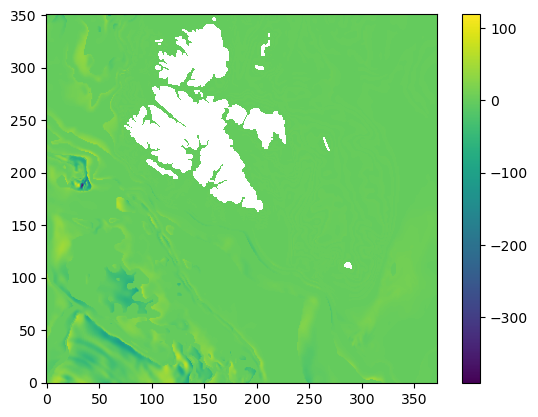

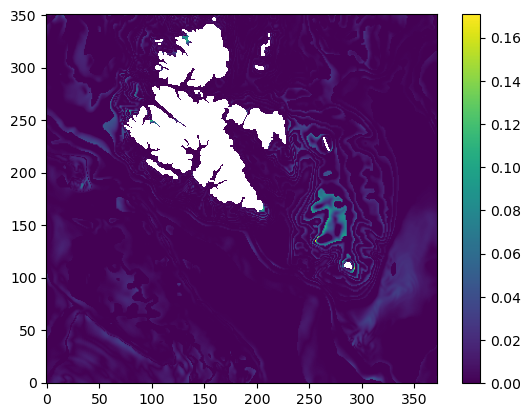

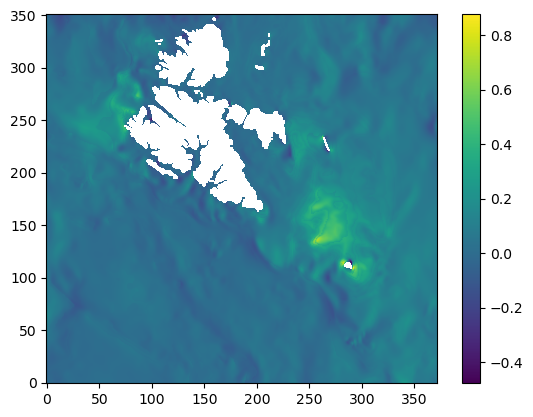

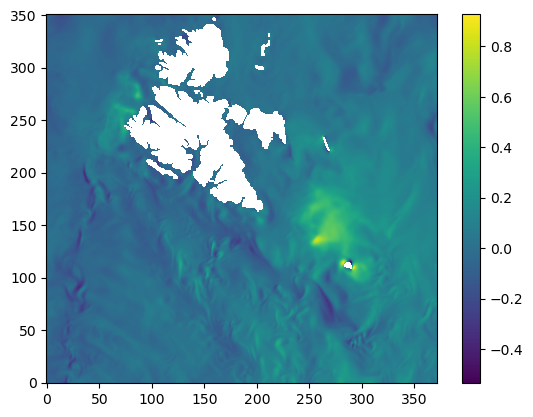

In [310]:
plt.imshow(hv-hv2, origin='lower')
plt.colorbar()

plt.figure()
plt.imshow(np.abs((hv/(eta0 + H_m)) - (hv2/(eta0 + H_m))), origin='lower')
plt.colorbar()

plt.figure()
plt.imshow(hv2/(eta0 + H_m), origin='lower')
plt.colorbar()

print(np.linalg.norm(hv - hv2))

plt.figure()
plt.imshow(v[0,:,:], origin='lower')
plt.colorbar()


[0.03324366 0.03506213 0.03727311 0.03761041 0.03758582 0.03638063
 0.03450969 0.03227459 0.02737742 0.022817   0.01908813 0.
 0.         0.         0.         0.        ]
[3.3243664e-02 3.5062127e-02 3.7273113e-02 3.7610408e-02 3.7585821e-02
 3.6380634e-02 3.4509692e-02 3.2274589e-02 2.7377419e-02 2.2817003e-02
 1.9088129e-02 9.9999999e+36 9.9999999e+36 9.9999999e+36 9.9999999e+36
 9.9999999e+36]


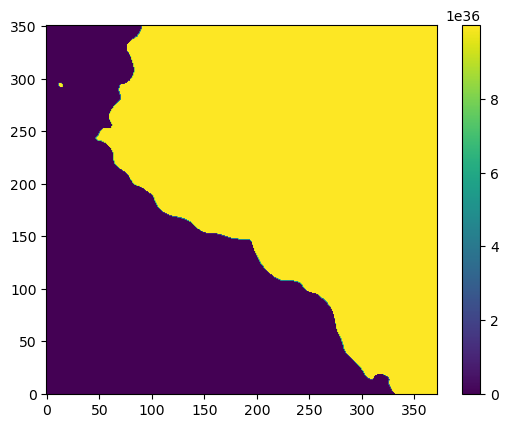

In [253]:
u.set_fill_value(0.0)
plt.imshow(u[12,:,:].data, origin='lower')
plt.colorbar()
print(u.filled()[:, -1, -1])
print(u.data[:, -1, -1])
#u[12,:,:]

In [207]:
#plt.imshow(hu[290:310, 290:310], origin='lower')
print(hu[295, 300])

j, i = 295, 300

depth_m = (depth[1:] + depth[:-1])/2 
dz = depth_m[1:] - depth_m[:-1]


def printStuff(i, j):
    print("------------------\n")
    testHu(i, j)
    tmp = np.zeros((16, 3), dtype=int)
    tmp[:, 0] = depth
    tmp[:, 1] = depth < H_m[j, i]
    tmp[:, 2] = u[:, j, i].mask
    print(tmp)
    print(H_m[j, i])
    print("num valid is min of ", len(depth_m) - np.sum(u.mask[:, j, i]), np.sum(depth < H_m[j, i]))
    num_valid = min(len(depth) - np.sum(u.mask[:, j, i]), sum(depth < H_m[j, i])) 
    hu_tmp2 = np.sum(dz[1:num_valid]*u[1:num_valid, j, i])
    print(num_valid, hu_tmp2)  

#printStuff(300, 300)
#printStuff(300, 295)
#printStuff(290, 109) #, 290)
printStuff(0,0)

Exception caught: Resetting to CUDA context gpu_ctx
Traceback (most recent call last):
  File "c:\Users\havardh\Miniconda3\envs\gpuocean-extra\lib\site-packages\IPython\core\interactiveshell.py", line 3552, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\havardh\AppData\Local\Temp\ipykernel_43116\4216555481.py", line 27, in <module>
    printStuff(0,0)
  File "C:\Users\havardh\AppData\Local\Temp\ipykernel_43116\4216555481.py", line 21, in printStuff
    hu_tmp2 = np.sum(dz[1:num_valid]*u[1:num_valid, j, i])
  File "c:\Users\havardh\Miniconda3\envs\gpuocean-extra\lib\site-packages\numpy\ma\core.py", line 4170, in __mul__
    return multiply(self, other)
  File "c:\Users\havardh\Miniconda3\envs\gpuocean-extra\lib\site-packages\numpy\ma\core.py", line 1015, in __call__
    result = self.f(da, db, *args, **kwargs)
ValueError: operands could not be broadcast together with shapes (13,) (15,) 


-12.132161
------------------

[1.5 6.5 12.5 20.0 37.5 62.5 87.5 125.0 175.0 225.0 275.0 400.0 750.0
 1500.0 2500.0]
upper layer hu:  -0.05077275002686843
1 [1.5, 6.5] -0.04808582 -0.29120184967605933
2 [6.5, 12.5] -0.05473309 -0.6196003902920948
3 [12.5, 20.0] -0.057036925 -1.0473773285963999
4 [20.0, 37.5] -0.058975056 -2.079440805337714
5 [37.5, 62.5] -0.076845005 -4.000565934202956
6 [62.5, 87.5] -0.08284221 -6.07162114532976
7 [87.5, 125.0] -0.074803434 -8.876749932042646
8 [125.0, 175.0] -0.068773106 -12.315405219070005
9 [175.0, 225.0] -0.052111626 -14.920986502639341
10 [225.0, 275.0] -0.04380863 -17.111418082586813
11 [275.0, 400.0] -0.042428683 -22.415003518781948
12 [400.0, 750.0] -0.02264652 -30.341285619161415
13 [750.0, 1500.0] -0.025571825 -49.520154356233164
14 [1500.0, 2500.0] -0.023855899 -73.37605288552432
result:  -73.37605288552432
[[   0    1    0]
 [   3    1    0]
 [  10    1    0]
 [  15    1    0]
 [  25    1    0]
 [  50    1    0]
 [  75    1    0]
 [ 100   

ValueError: operands could not be broadcast together with shapes (13,) (15,) 

In [176]:
print(len(depth) - np.sum(u.mask[:, j, i]))
print(sum(depth < H_m[j, i]))
min(len(depth) - np.sum(u.mask[:, j, i]), sum(depth < H_m[j, i])) 

print(depth)
print(depth_m)
print(dz)

dz.shape == depth.shape

9
10
[   0.    3.   10.   15.   25.   50.   75.  100.  150.  200.  250.  300.
  500. 1000. 2000. 3000.]
[1.5 6.5 12.5 20.0 37.5 62.5 87.5 125.0 175.0 225.0 275.0 400.0 750.0
 1500.0 2500.0]
[5.0 6.0 7.5 17.5 25.0 25.0 37.5 50.0 50.0 50.0 125.0 350.0 750.0 1000.0]


False